<a href="https://colab.research.google.com/github/acreatorrr/Gesture-recognise-/blob/main/Mediapipe_dlib_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Mount gdrive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 39.0 MB/s eta 0:00:00


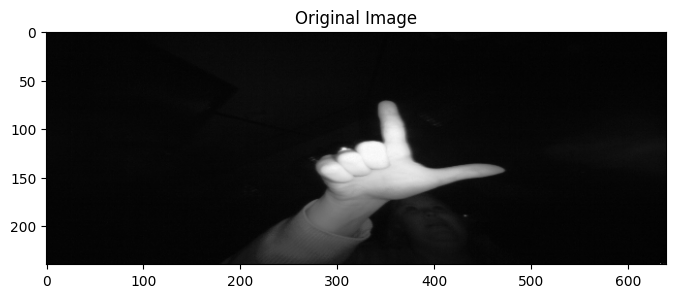

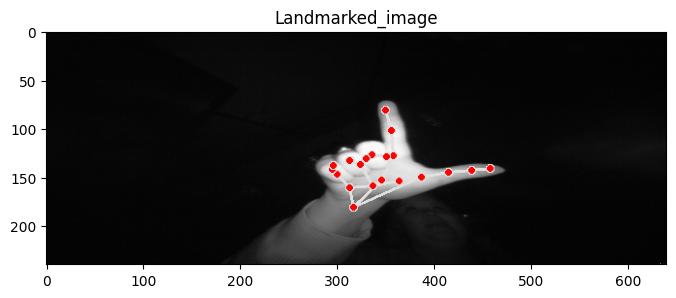

In [ ]:
import cv2
import mediapipe as mp
import os
import matplotlib.pyplot as plt
import random
from google.colab.patches import cv2_imshow


# Initialize mediapipe hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
mp_drawing = mp.solutions.drawing_utils

# Image directory
image_dir = "/content/drive/MyDrive/hand_sign_data"

# Output directory
output_dir = "/content/drive/MyDrive/Gesture_recognise"
os.makedirs(output_dir, exist_ok=True)

# Get a list of image files
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]

# Select a random image
if image_files:
    random_image_file = random.choice(image_files)
    image_path = os.path.join(image_dir, random_image_file)

    # Load the image
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not read image at {image_path}")
        else:
          # Display original image
          plt.figure(figsize=(8,6))
          plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
          plt.title("Original Image")
          plt.show()

          image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

          # Process the image and get hand landmarks
          results = hands.process(image_rgb)


          # Draw hand landmarks on the image if detected
          if results.multi_hand_landmarks:
              for hand_landmarks in results.multi_hand_landmarks:
                  mp_drawing.draw_landmarks(image, hand_landmarks, mp_hands.HAND_CONNECTIONS)

          # Display the processed image
          plt.figure(figsize=(8,6))
          plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
          plt.title("Landmarked_image")
          plt.show()


          # Save the processed image
          output_path = os.path.join(output_dir, random_image_file)
          cv2.imwrite(output_path, image)


    except Exception as e:
        print(f"Error processing {random_image_file}: {e}")
else:
    print(f"No images found in the directory: {image_dir}")

hands.close()

In [ ]:
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2

--2025-01-28 04:46:36--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-01-28 04:46:36--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  33.4MB/s    in 1.8s    

2025-01-28 04:46:38 (33.4 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



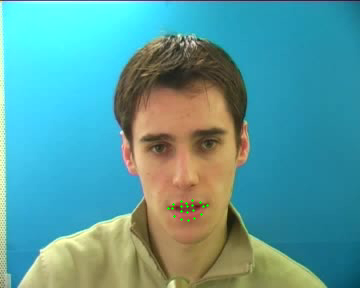

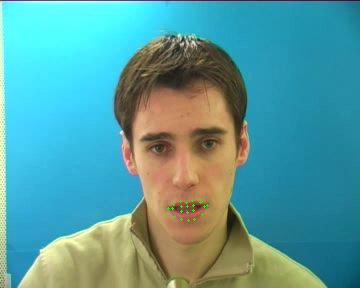

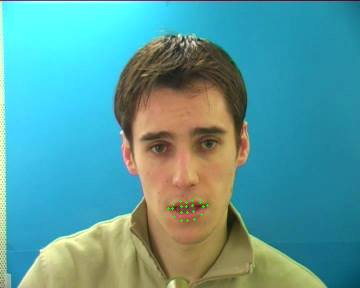

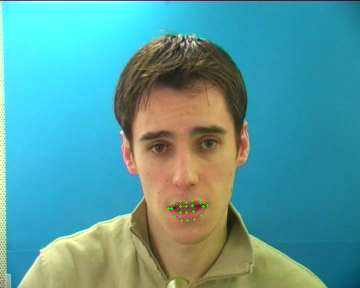

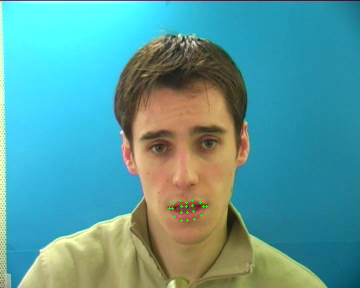

...

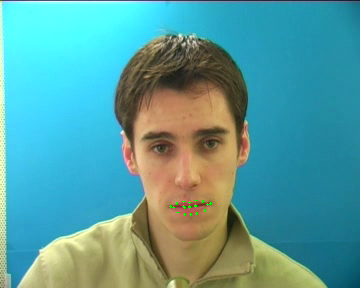

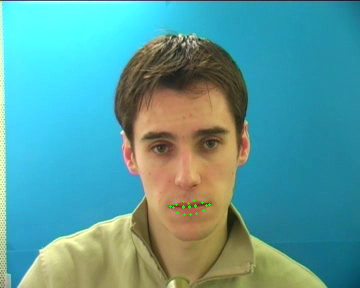

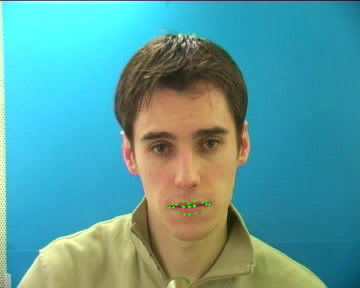

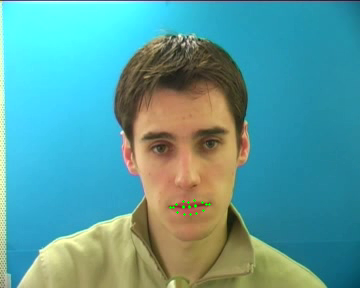

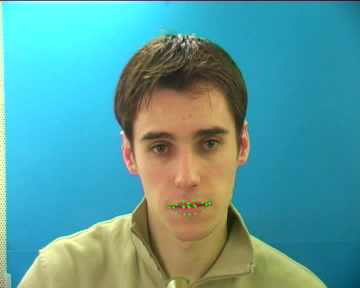

In [ ]:
import cv2
import dlib
import os
from google.colab.patches import cv2_imshow

# Load the pre-trained facial landmark detector from dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/content/shape_predictor_68_face_landmarks.dat')

# Load the video
cap = cv2.VideoCapture('/content/drive/MyDrive/lip_data.mpg')

# Output folder for frames
output_folder = '/content/processed_frames'
os.makedirs(output_folder, exist_ok=True)

frame_count = 0  # Counter for frame numbering

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the frame
    faces = detector(gray)

    for face in faces:
        # Get facial landmarks
        landmarks = predictor(gray, face)

        # Get lip landmarks (usually indices 48 to 67)
        for i in range(48, 68):
            x, y = landmarks.part(i).x, landmarks.part(i).y
            cv2.circle(frame, (x, y), 1, (0, 255, 0), -1)  # Draw lip landmarks

    # Save the processed frame to the output folder
    frame_filename = os.path.join(output_folder, f'frame_{frame_count:04d}.jpg')
    cv2.imwrite(frame_filename, frame)
    frame_count += 1

    # Display the result using cv2_imshow
    cv2_imshow(frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


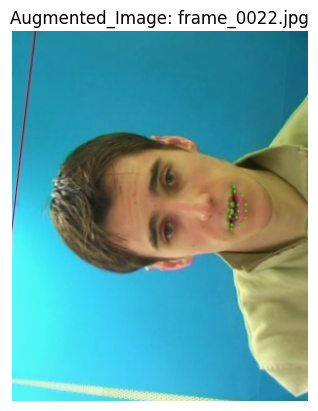

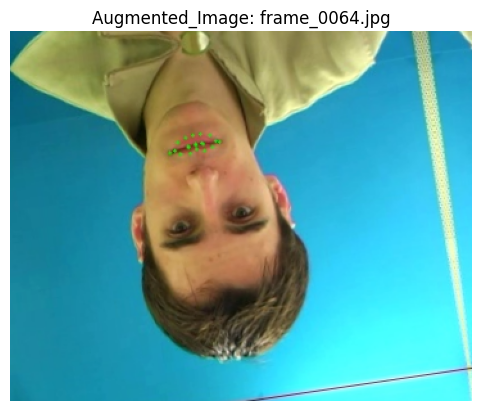

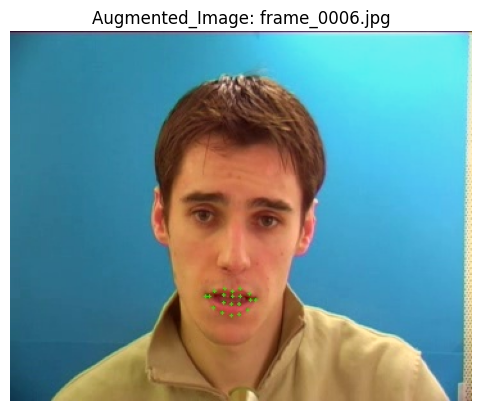

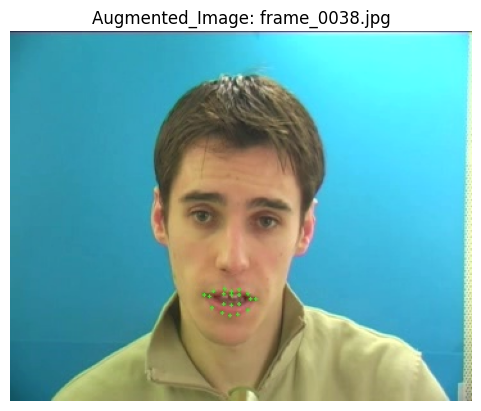

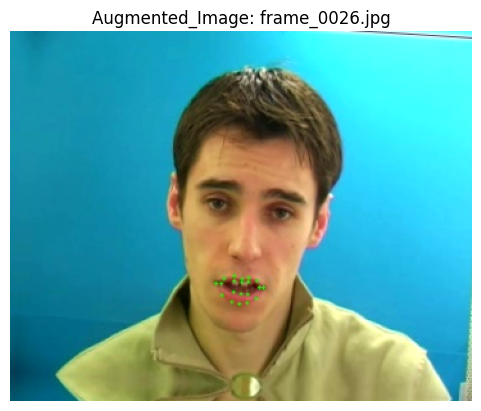

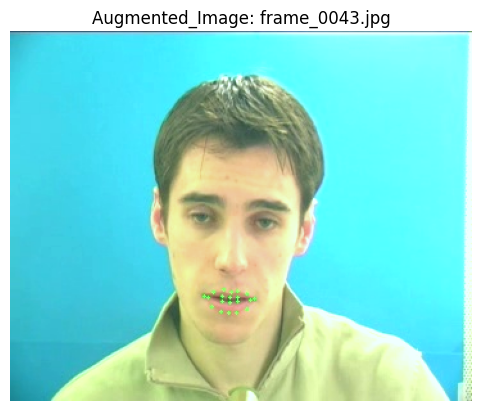

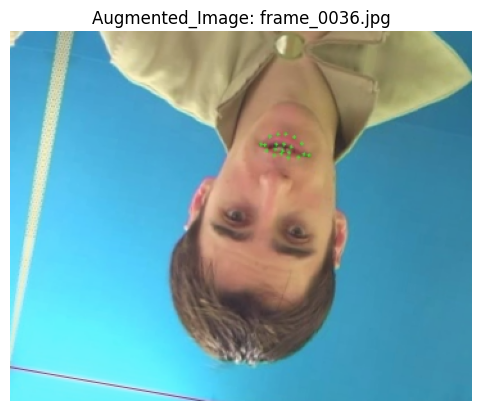

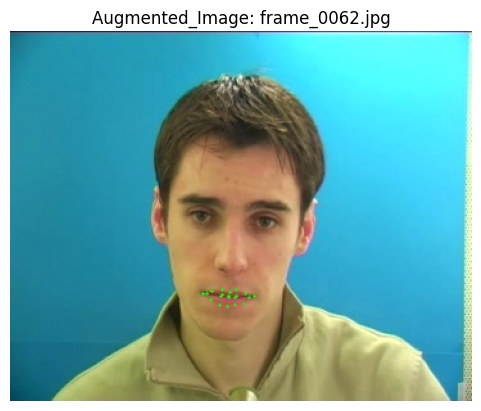

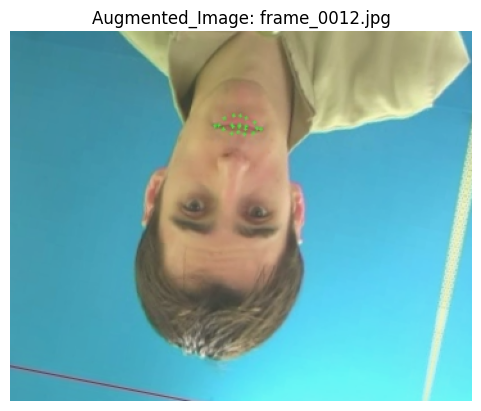

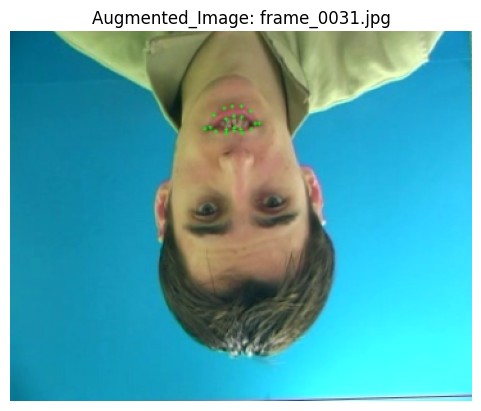

In [ ]:
import os
import cv2
import random
import albumentations as A
import matplotlib.pyplot as plt

# Input and output folders
input_folder = "/content/processed_frames"
output_folder = "/content/augmentation"
os.makedirs(output_folder, exist_ok=True)

# Define augmentation pipeline
transform = A.Compose([
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=0.5),  # No need to import HorizontalFlip separately
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=0.5),
])

# Process each image in the dataset
augmented_images = []
for img_name in os.listdir(input_folder):
    img_path = os.path.join(input_folder, img_name)
    image = cv2.imread(img_path)
    if image is None:
        continue

    # Apply augmentation
    augmented = transform(image=image)
    augmented_image = augmented["image"]

    # Save the augmented image
    output_path = os.path.join(output_folder, f"aug_{img_name}")
    cv2.imwrite(output_path, augmented_image)
    augmented_images.append((augmented_image, img_name))  # Store image and its name

# Randomly select 10 images to display
random_sample = random.sample(augmented_images, min(10, len(augmented_images)))

# Display the randomly selected augmented images
for aug_image, img_name in random_sample:
    plt.figure()
    plt.imshow(cv2.cvtColor(aug_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Augmented_Image: {img_name}")
    plt.axis("off")

plt.show()
